<a href="https://colab.research.google.com/github/AiswaryaSriram/Reverse-Visual-Search-AI-team-10/blob/main/AI_Project_FaceNet_KNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!pip install mtcnn

     |████████████████████████████████| 2.3 MB 31.9 MB/s 


In [ ]:
from matplotlib import pyplot as plt
from PIL import Image
from numpy import asarray
from numpy import array
from mtcnn.mtcnn import MTCNN
from keras.models import load_model
from numpy import expand_dims
from numpy import reshape
from numpy import load
from numpy import max
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
import cv2, imageio
import os
#from tqdm import tqdm
from tqdm.notebook import tqdm
import tensorflow as tf
tf.get_logger().setLevel('WARNING')
import pandas as pd

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
task = 'facenetKNN'

In [ ]:
!git clone https://github.com/satinder147/Attendance-using-Face.git

modelPath = 'Attendance-using-Face/facenet_keras.h5'

Cloning into 'Attendance-using-Face'...
remote: Enumerating objects: 85, done.
remote: Total 85 (delta 0), reused 0 (delta 0), pack-reused 85
Unpacking objects: 100% (85/85), done.


In [ ]:
homeDir = '/content/drive/MyDrive'
projDir = os.path.join(homeDir, 'AI_Project')
taskDir = os.path.join(projDir, task)
taskModelDir = os.path.join(taskDir, 'model')
taskDataDir = os.path.join(taskDir, 'data')
#lfwDir = '/content/drive/MyDrive/lfw_kaggle'
#imageDir = '/content/drive/MyDrive/lfw_kaggle/lfw-deepfunneled/lfw-deepfunneled'

In [ ]:
if not os.path.exists(projDir):
  os.makedirs(projDir)

if not os.path.exists(taskDir):
  os.makedirs(taskDir)

if not os.path.exists(taskModelDir):
  os.makedirs(taskModelDir)  

if not os.path.exists(taskDataDir):
  os.makedirs(taskDataDir)    

In [ ]:
#remove existing folder if any
lfwDir = os.path.join(projDir, 'lfw-deepfunneled')
!rm -rf $lfwDir

#Download, unzip and move the lfw folder to the project directory
!wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz
!tar -xzvf lfw-deepfunneled.tgz
!mv lfw-deepfunneled $projDir
!rm -rf lfw-deepfunneled.tgz

Streaming output truncated to the last 5000 lines.
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0012.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0013.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0014.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0015.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0016.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0017.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0018.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0019.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0020.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0021.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0022.jpg
lfw-deepfunneled/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0023.jpg
lfw-deepfunne

# Face Detection + Embeddings

In [ ]:
#Function to read an image from specified path, detect a face on it, crop and return the part of the image which contains the face
def extract_image(image):
  img = Image.open(image)
  #img = io.imread(image)
  img1 = img.convert('RGB')
  pixels = asarray(img1)
  detector = MTCNN()
  f = detector.detect_faces(pixels)
  
  #If no face detected, return the entire image
  if(len(f)==0):
    return asarray(img.resize((160, 160)))

  #Else return only the face area
  x1,y1,w,h = f[0]['box']
  x1, y1 = abs(x1), abs(y1)
  x2 = abs(x1+w)
  y2 = abs(y1+h)
  store_face = pixels[y1:y2,x1:x2]
  image1 = Image.fromarray(store_face,'RGB')
  image1 = image1.resize((160,160))
  face_array = asarray(image1)
  return face_array

In [ ]:
#extracting embeddings
def extract_embeddings(model,face_pixels):
  face_pixels = face_pixels.astype('float32')
  mean = face_pixels.mean()
  std  = face_pixels.std()
  face_pixels = (face_pixels - mean)/std
  samples = expand_dims(face_pixels,axis=0)
  yhat = model.predict(samples)
  return yhat[0]

In [ ]:
def saveEmbeddings(Img, model):

  #load data and reshape the image
  face = extract_image(Img)
  testx = asarray(face)
  testx = testx.reshape(-1,160,160,3)
  #print("Input test data shape: ",testx.shape)

  #find embeddings
  new_testx = list()
  for test_pixels in testx:
    embeddings = extract_embeddings(model,test_pixels)
    new_testx.append(embeddings)

  new_testx = asarray(new_testx)  
  #print("Input test embedding shape: ",new_testx.shape)

  #Get key elements
  personName = Img.split('/')[-2]
  fileName = Img.split('/')[-1]

  #Add to embedding dictionary
  key = Img
  embeddingDict[key] = new_testx  
  
  #Create folder for current person if it doesn't exist
  personFolder = os.path.join(lfwTransformed, personName)
  if not os.path.exists(personFolder):
    os.makedirs(personFolder)

  #construct output path
  outputPath = os.path.join(personFolder, fileName)

  #write image
  imageio.imwrite(outputPath, face)

In [ ]:
#Create folder for storing faces if required
lfwTransformed = os.path.join(taskDataDir, 'lfw_transformed')

if not os.path.exists(lfwTransformed):
  os.makedirs(lfwTransformed)

In [ ]:
lfwTransformed
#taskDataDir

'/content/drive/MyDrive/AI_Project/facenetKNN/data/lfw_transformed'

In [ ]:
#Initialize Embedding Dictionary to store the Embeddings
embeddingDict = {}

#define imageDir path
#imageDir = lfwDir #os.path.join(taskDataDir, 'lfw-deepfunneled/lfw-deepfunneled')

#get subdirectories
subdirs = [subdir for subdir in os.listdir(lfwDir) if os.path.isdir(os.path.join(lfwDir, subdir))]


#Load model
model = load_model(modelPath)

#Loop through images and store embeddings
for subdir in tqdm(subdirs):
  subdir_fullpath = os.path.join(lfwDir, subdir)
  
  if len(os.listdir(subdir_fullpath)) == 0:
    print(subdir_fullpath + ' is empty')
    break
  
  print('\nProcessing ' + subdir + '.....')
  #for filename in tqdm(os.listdir(subdir_fullpath)):
  for filename in os.listdir(subdir_fullpath):
    filePath = os.path.join(subdir_fullpath, filename)

    #Compute the embedding save it in the embedding dict
    saveEmbeddings(filePath, model)

  0%|          | 0/5749 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.

Processing Lee_Hong-ki.....

Processing Lee_Hyung-taik.....

Processing Lee_Jun.....

Processing Lee_Nam-shin.....

Processing Lee_Soo-hyuck.....

Processing Lee_Tae-sik.....

Processing Lee_Yeo-jin.....

Processing Lee_Yuan-tseh.....

Processing Leigh_Winchell.....

Processing Leisel_Jones.....

Processing Lela_Rochon.....

Processing Leland_Chapman.....

Processing Lemuel_Montulo.....

Processing Len_Jenoff.....

Processing Lena_Katina.....

Processing Lena_Olin.....

Processing Lene_Espersen.....

Processing Leni_Bjorklund.....

Processing Lennart_Johansson.....

Processing Lennox_Lewis.....

Processing Lenny_Kravitz.....

Processing Lenny_Wilkens.....

Processing Leo_Mullin.....

Processing Leo_Ramirez.....

Processing Leon_Barmore.....

Processing Leon_LaPorte.....

Processing Leon_Lai.....

Processing Leon_Silver.....

Processing Leonard_Glick.....

Processing Leonard_Hamilton.....

Processing Leonard_Schrank.....

Processing Le

In [ ]:
#Save embedding Dict file to a pickle file
df = pd.DataFrame(columns=['file', 'features'])
df['file'] = embeddingDict.keys()
df['features'] = embeddingDict.values()
df.to_pickle(os.path.join(taskModelDir, 'embeddings.pickle'))

# Finding Similar Images based on embeddings

In [ ]:
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
import imageio as io
import joblib
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
import numpy as np
import tensorflow as tf
from tensorflow import keras
from PIL import Image
from numpy import asarray
from numpy import array
from numpy import expand_dims
from numpy import reshape
from numpy import load
from numpy import max

In [ ]:
#Function to get Image embedding for a givem Image path and model
def getEmbeddings(Img, model):

  #load data and reshape the image
  face = extract_image(Img)
  testx = asarray(face)
  testx = testx.reshape(-1,160,160,3)
  #print("Input test data shape: ",testx.shape)

  #find embeddings
  new_testx = list()
  for test_pixels in testx:
    embeddings = extract_embeddings(model,test_pixels)
    new_testx.append(embeddings)

  #get embedding
  new_testx = asarray(new_testx)

  return new_testx

In [ ]:
#Read in the embedding file
df = pd.read_pickle(os.path.join(taskModelDir, 'embeddings.pickle'))
df.head()

,file,features
0,/content/drive/MyDrive/AI_Project/lfw-deepfunn...,"[[-2.2663724, -1.9509584, 0.78288925, 0.461083..."
1,/content/drive/MyDrive/AI_Project/lfw-deepfunn...,"[[0.084122635, -0.23472588, 0.16605562, -0.000..."
2,/content/drive/MyDrive/AI_Project/lfw-deepfunn...,"[[-1.3868631, -0.6679971, -1.2805507, -1.63743..."
3,/content/drive/MyDrive/AI_Project/lfw-deepfunn...,"[[-1.162565, -0.8586979, -1.3504152, 1.812409,..."
4,/content/drive/MyDrive/AI_Project/lfw-deepfunn...,"[[0.4146637, 0.005395405, 0.33990467, -0.32980..."


In [ ]:
data_encoded_temp = np.asarray(list(df['features']))
print(data_encoded_temp.shape)

data_encoded = data_encoded_temp.reshape((data_encoded_temp.shape[0],data_encoded_temp.shape[2]))
print(data_encoded.shape)

(13233, 1, 128)
(13233, 128)


In [ ]:
K=[3]

kmeans = KMeans(n_clusters = K[0], random_state=0).fit(data_encoded)
labels=kmeans.labels_
centroids = kmeans.cluster_centers_

In [ ]:
kmeans_file = os.path.join(taskModelDir, 'kmeans_model.pkl')
joblib.dump(kmeans,kmeans_file)

['/content/drive/MyDrive/AI_Project/facenetKNN/model/kmeans_model.pkl']

In [ ]:
lisp = list(df['file'])

print(lisp)

['/content/drive/MyDrive/AI_Project/lfw-deepfunneled/AJ_Cook/AJ_Cook_0001.jpg', '/content/drive/MyDrive/AI_Project/lfw-deepfunneled/AJ_Lamas/AJ_Lamas_0001.jpg', '/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Aaron_Eckhart/Aaron_Eckhart_0001.jpg', '/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Aaron_Guiel/Aaron_Guiel_0001.jpg', '/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Aaron_Patterson/Aaron_Patterson_0001.jpg', '/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0001.jpg', '/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0002.jpg', '/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0003.jpg', '/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Aaron_Peirsol/Aaron_Peirsol_0004.jpg', '/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Aaron_Pena/Aaron_Pena_0001.jpg', '/content/drive/MyDrive/AI_Project/lfw-deepfunneled/Aaron_Sorkin/Aaron_Sorkin_0001.jpg', '/content/drive/MyDrive/AI_P

In [ ]:
clusters_features = []
cluster_files=[]
for i in [0,1,2,3,4,5]:
    i_cluster = []
    i_labels=[]
    for iter,j in enumerate(kmeans.labels_):
        if j==i:
            i_cluster.append(data_encoded[iter])
            i_labels.append(lisp[iter])
    i_cluster = np.array(i_cluster)
    clusters_features.append(i_cluster)
    cluster_files.append(i_labels)

In [ ]:
labels=[]
data=[]
files=[]
for iter,i in enumerate(clusters_features):
    data.extend(i)
    labels.extend([iter for i in range(i.shape[0])])
    files.extend(cluster_files[iter])
print(np.array(labels).shape)
print(np.array(data).shape)
print(np.array(files).shape)

(13233,)
(13233, 128)
(13233,)


KNN

In [ ]:
knn = KNeighborsClassifier(n_neighbors=9,algorithm='ball_tree',n_jobs=-1)
knn.fit(np.array(data),np.array(labels))

KNeighborsClassifier(algorithm='ball_tree', n_jobs=-1, n_neighbors=9)

In [ ]:
#knn_file = '/content/drive/My Drive/knn_model.pkl'
knn_file = os.path.join(taskModelDir, 'knn_model.pkl')
joblib.dump(knn,knn_file)

['/content/drive/MyDrive/AI_Project/facenetKNN/model/knn_model.pkl']

In [ ]:
def results_(query,result):
    
    """
    Plotting the N similar images from the dataset with query image.
    Arguments:
    query - (string) - filename of the query image
    result - (list) - filenames of similar images
    """

    def read(img):
        image = cv2.imread(img)
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        return image
    plt.figure(figsize=(10,5))
    if type(query)!=type(30):
        plot_(read(query),"","",1,1,1,"Query Image - " + query.split('/')[-2],"","","",True)
    else:
        plot_(read(files[query]),"","",1,1,1,"Query Image "+files[query],"","","",True)
    plt.show()
    plt.figure(figsize=(20,20))
    for iter,i in enumerate(result):
        #plot_(read(files[i]),"","",1,len(result),iter+1,files[i].split('/')[-1],"","","",True)
        plot_(read(files[i]),"","",4, 5,iter+1,files[i].split('/')[-1],"","","",True)
    plt.show()

In [ ]:
def plot_(x,y1,y2,row,col,ind,title,xlabel,ylabel,label,isimage=False,color='b'):

    """
    This function is used for plotting images and graphs (Visualization of end results of model training)
    Arguments:
    x - (np.ndarray or list) - an image array
    y1 - (list) - for plotting graph on left side.
    y2 - (list) - for plotting graph on right side.
    row - (int) - row number of subplot 
    col - (int) - column number of subplot
    ind - (int) - index number of subplot
    title - (string) - title of the plot 
    xlabel - (list) - labels of x axis
    ylabel - (list) - labels of y axis
    label - (string) - for adding legend in the plot
    isimage - (boolean) - True in case of image else False
    color - (char) - color of the plot (prefered green for training and red for testing).
    """
    plt.subplot(row,col,ind)

    if isimage:
        plt.imshow(x)
        plt.title(title)
        plt.axis('off')
    else:
        plt.plot(y1,label=label,color='g'); plt.scatter(x,y1,color='g')
        if y2!='': plt.plot(y2,color=color,label='validation'); plt.scatter(x,y2,color=color)
        plt.grid()
        plt.legend()
        plt.title(title); plt.xlabel(xlabel); plt.ylabel(ylabel)

In [ ]:
def predictions(fileName, df, N=6, isurl=False):

    """
    Making predictions for the query images and returns N similar images from the dataset.
    We can either pass filename or the url for the image.
    Arguments:
    label - (string) - file name of the query image.
    N - (int) - Number of images to be returned
    isurl - (string) - if query image is from google is set to True else False(By default = False)
    """

    #load model
    model = load_model(modelPath)

    feature = np.asarray(list(getEmbeddings(fileName, model)))
    #np.asarray(list(df['features']))
    #print(feature.shape)
    res = knn.kneighbors(feature.reshape(1,-1),return_distance=True,n_neighbors=N+1)
    results_(fileName,list(res[1][0])[1:])

    #delete variables
    del model, feature, res

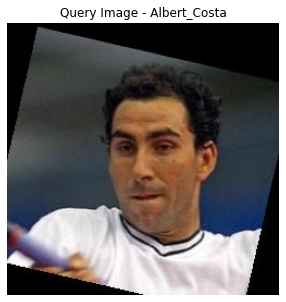

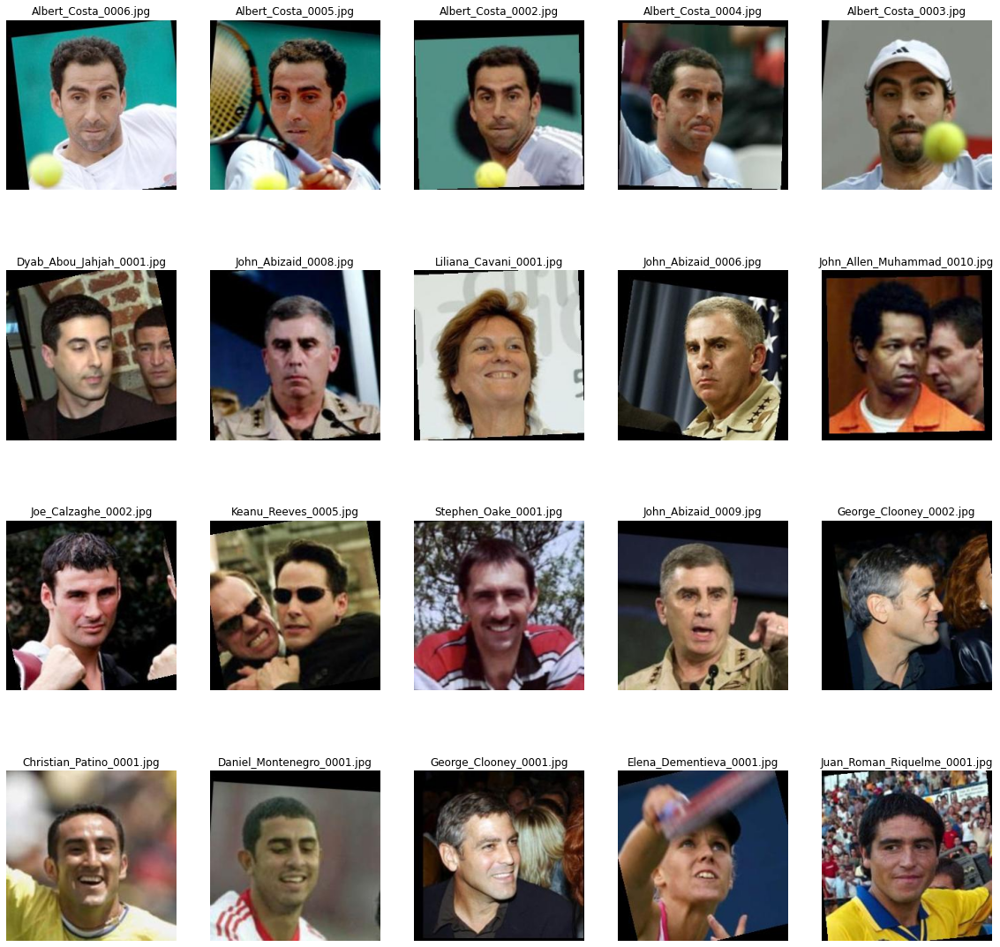

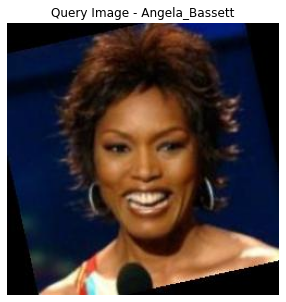

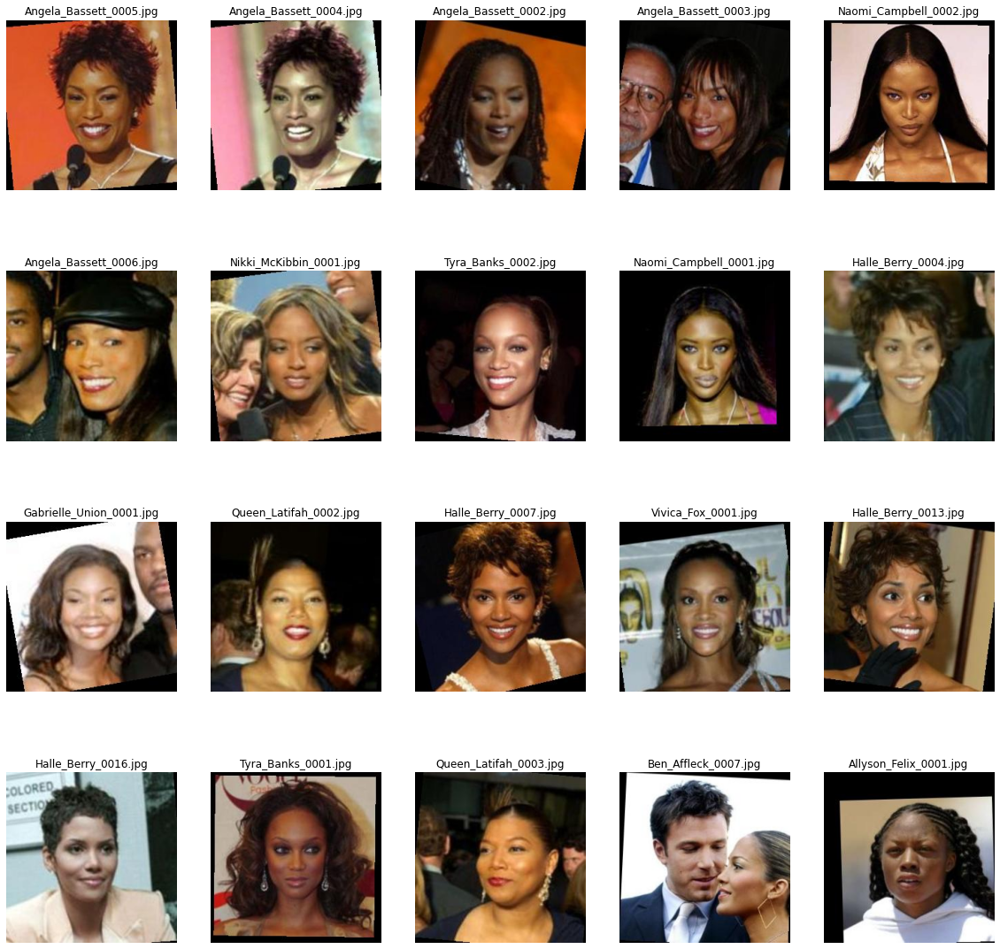

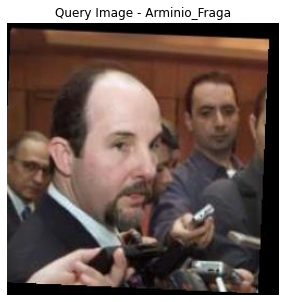

...

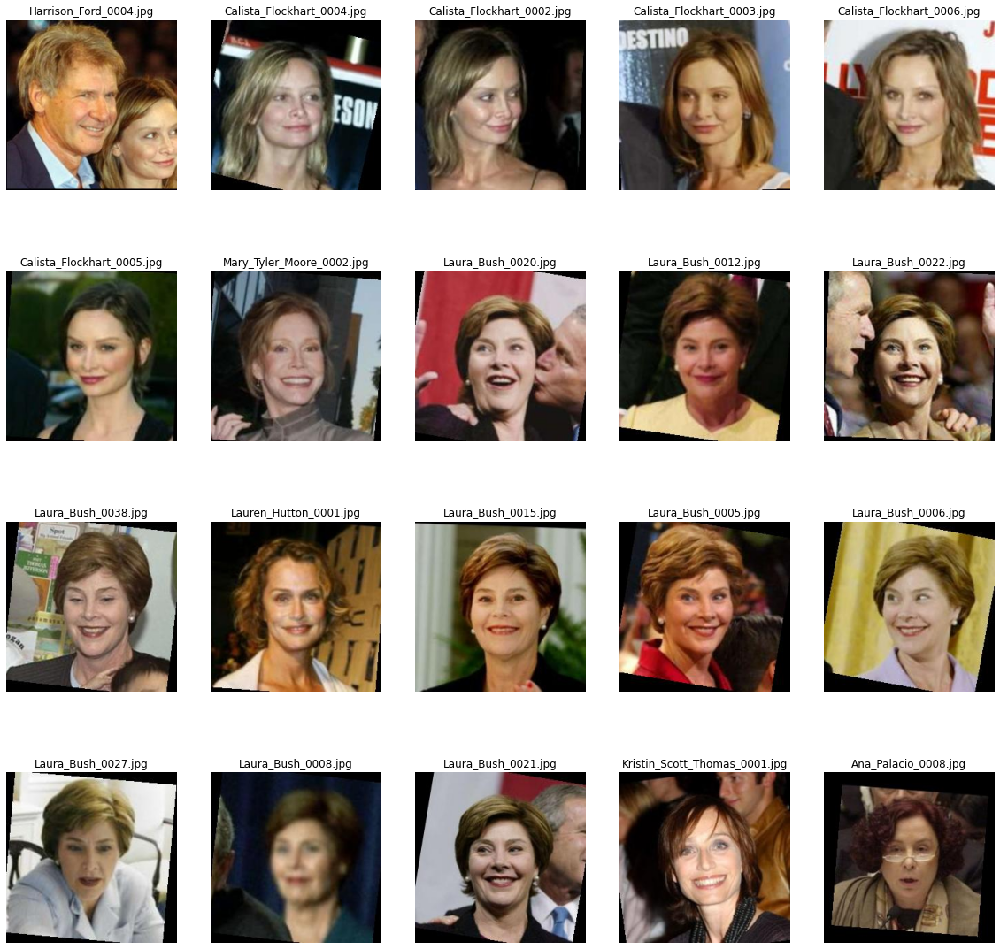

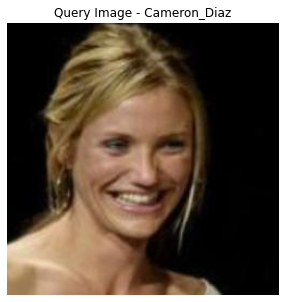

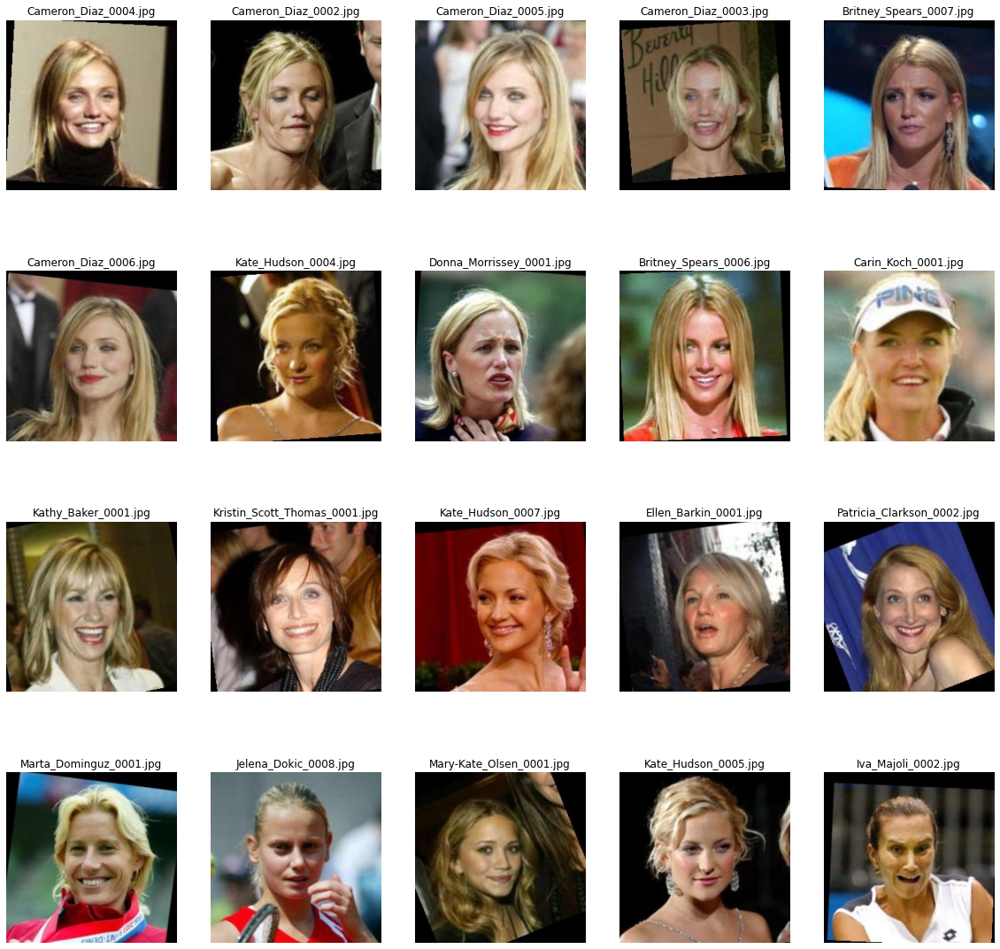

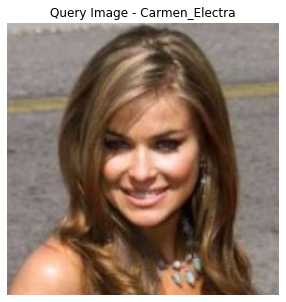

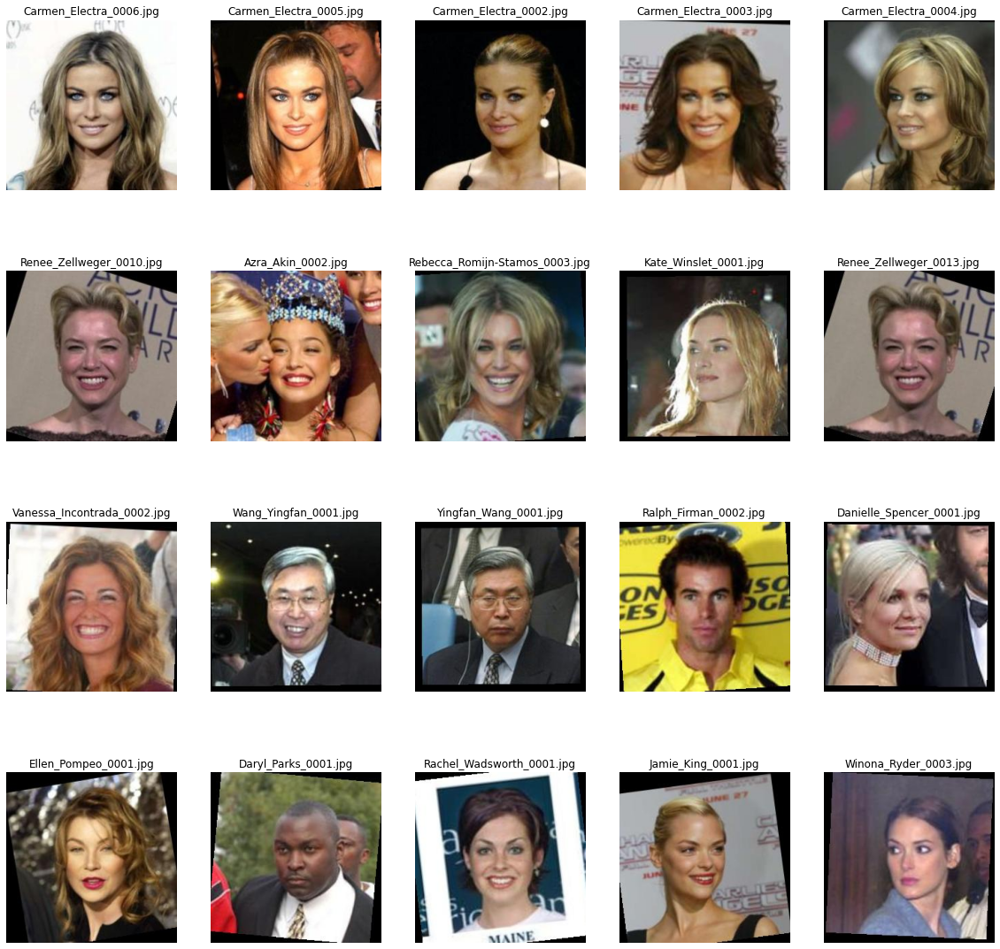

In [ ]:
test_names = ['Albert_Costa', 
              'Angela_Bassett',
              'Arminio_Fraga', 
              'Billy_Crystal', 
              'Bob_Graham', 
              'Boris_Becker', 
              'Bulent_Ecevit', 
              'Calista_Flockhart', 
              'Cameron_Diaz', 
              'Carmen_Electra']


for name in test_names:
  filePath = os.path.join(lfwDir, str(name) + '/' + str(name) + '_0001.jpg')
  
  predictions(filePath, df, N = 20)